Chapter 25 Plotting with Dataframes

In [5]:
import pandas as pd

In [2]:
# deletes variables
%reset -f

In [6]:
# version 2 , simplified the columns assignment, combined and modified rename(), move rename() with underscore
def tweak_siena_pres_2(df):
    def int64_to_uint8(df_):
        cols = df_.select_dtypes('int64')
        return (df_
                .astype({col:'uint8' for col in cols}))

    return (df
     .rename(columns=
        {'Seq.':'Seq',
         'Bg': 'Background',
         'PL': 'Party leadership', 'CAb': 'Communication ability',
         'RC': 'Relations with Congress', 'CAp': 'Court appointments',
         'HE': 'Handling of economy', 'L': 'Luck',
         'AC': 'Ability to compromise', 'WR': 'Willing to take risks',
         'EAp': 'Executive appointments', 'OA': 'Overall ability',
         'Im': 'Imagination', 'DA': 'Domestic accomplishments',
         'Int': 'Integrity', 'EAb': 'Executive ability',
         'FPA': 'Foreign policy accomplishments',
         'LA': 'Leadership ability',
         'IQ': 'Intelligence', 'AM': 'Avoid crucial mistakes',
         'EV': "Experts' view", 'O': 'Overall'})
     .rename(columns = lambda c:c.replace(' ','_'))
     .astype({'Party':'category'})  # 2
     .pipe(int64_to_uint8)  # 3
     .assign(Average_rank=lambda df_:df_.select_dtypes('uint8') # 4
                 .sum(axis=1).rank(method='dense').astype('uint8'),
             Quartile=lambda df_:pd.qcut(df_.Average_rank, 4,
                 labels='1st 2nd 3rd 4th'.split())
            )
    )

In [7]:
pd.set_option('display.max_rows', 10)             
url = 'https://github.com/mattharrison/datasets/raw/master/data/'\
    'siena2018-pres.csv'
df = pd.read_csv(url, index_col=0)

In [7]:
pres = tweak_siena_pres_2(df)

25.1 Line Plots

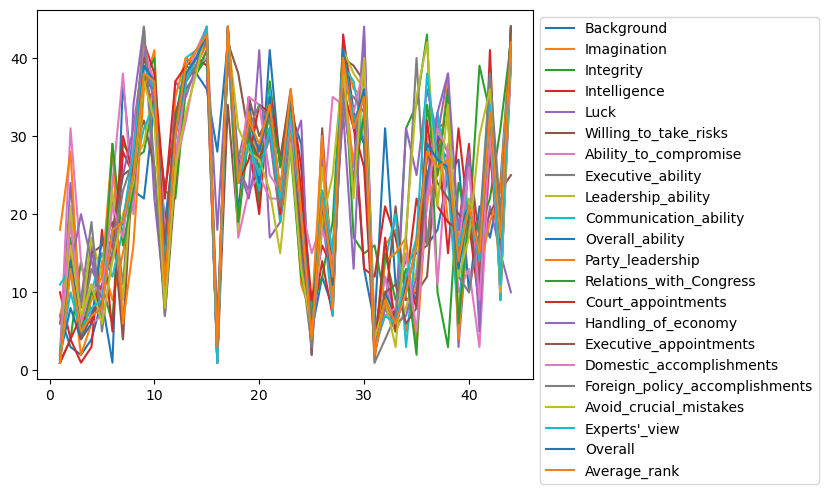

In [57]:
pres.plot().legend(bbox_to_anchor=(1,1))

In [58]:
# cleaning up the data, change the index to President

( pres
 .set_index('President')
)

,Seq,Party,Background,Imagination,Integrity,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,Executive_ability,...,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,Foreign_policy_accomplishments,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank,Quartile
President,,,,,,,,,,,,,,,,,,,,,
George Washington,1,Independent,7,7,1,10,1,6,2,2,...,1,1,1,2,2,1,2,1,1,1st
John Adams,2,Federalist,3,13,4,4,24,14,31,21,...,4,13,15,19,13,16,10,14,13,2nd
Thomas Jefferson,3,Democratic-Republican,2,2,14,1,8,5,14,6,...,7,20,4,6,9,7,5,5,5,1st
James Madison,4,Democratic-Republican,4,6,7,3,16,15,6,13,...,6,14,7,11,19,11,8,7,7,1st
James Monroe,5,Democratic-Republican,9,14,11,18,6,16,7,10,...,11,9,9,10,5,6,9,8,8,1st
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
George H. W. Bush,41,Republican,10,27,18,19,20,27,13,20,...,29,28,19,26,10,17,21,21,21,2nd
Bill Clinton,42,Democratic,21,12,39,8,11,17,3,16,...,10,5,12,9,18,30,14,15,15,2nd
George W. Bush,43,Republican,17,29,33,41,21,20,28,34,...,28,36,29,30,38,36,34,33,33,3rd


plot() can be called and by default it creates a line plot

(mpg
 .groupby('year')
 .mean()
 .plot()
)

In [12]:
#filtering out columns with loc
( pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']   # ::2 means all the rows but skip every 2nd one
)

,Background,Imagination,Integrity,Intelligence,Luck,Willing_to_take_risks,Ability_to_compromise,Executive_ability,Leadership_ability,Communication_ability,...,Party_leadership,Relations_with_Congress,Court_appointments,Handling_of_economy,Executive_appointments,Domestic_accomplishments,Foreign_policy_accomplishments,Avoid_crucial_mistakes,Experts'_view,Overall
President,,,,,,,,,,,,,,,,,,,,,
George Washington,7,7,1,10,1,6,2,2,1,11,...,18,1,1,1,1,2,2,1,2,1
Thomas Jefferson,2,2,14,1,8,5,14,6,6,4,...,5,5,7,20,4,6,9,7,5,5
James Monroe,9,14,11,18,6,16,7,10,12,15,...,12,8,11,9,9,10,5,6,9,8
Andrew Jackson,37,15,29,28,4,4,38,11,9,18,...,6,16,30,25,25,17,23,20,19,19
William Henry Harrison,22,38,28,37,44,32,41,38,29,31,...,36,37,42,41,40,42,44,37,39,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Lyndon B. Johnson,15,11,34,22,25,10,9,9,13,17,...,3,2,8,12,8,5,40,35,17,16
Gerald Ford,18,32,10,30,30,29,11,31,30,33,...,25,25,21,33,24,31,28,21,27,27
Ronald Reagan,27,17,24,31,3,13,10,15,7,6,...,4,6,18,18,20,16,12,12,16,13


In [14]:
#Transpose T property or transpose() method
( pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']
 .T
)

President,George Washington,Thomas Jefferson,James Monroe,Andrew Jackson,William Henry Harrison,James K. Polk,Millard Fillmore,James Buchanan,Andrew Johnson,Rutherford B. Hayes,...,Theodore Roosevelt,Woodrow Wilson,Calvin Coolidge,Franklin D. Roosevelt,Dwight D. Eisenhower,Lyndon B. Johnson,Gerald Ford,Ronald Reagan,Bill Clinton,Barack Obama
Background,7,2,9,37,22,19,40,36,42,35,...,5,8,32,6,11,15,18,27,21,24
Imagination,7,2,14,15,38,10,37,43,42,30,...,4,8,36,3,18,11,32,17,12,11
Integrity,1,14,11,29,28,23,36,40,41,32,...,8,19,17,16,5,34,10,24,39,13
Intelligence,10,1,18,28,37,23,38,39,42,29,...,6,7,33,12,17,22,30,31,8,9
Luck,1,8,6,4,44,9,35,42,40,23,...,2,14,13,5,7,25,30,3,11,15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Domestic_accomplishments,2,6,10,17,42,12,37,44,43,35,...,4,14,33,3,8,5,31,16,9,13
Foreign_policy_accomplishments,2,9,5,23,44,8,37,43,41,31,...,3,11,35,1,7,40,28,12,18,20
Avoid_crucial_mistakes,1,7,6,20,37,8,33,44,43,28,...,5,25,22,4,3,35,21,12,30,10
Experts'_view,2,5,9,19,39,13,37,44,43,29,...,4,15,32,3,6,17,27,16,14,11


<AxesSubplot: >

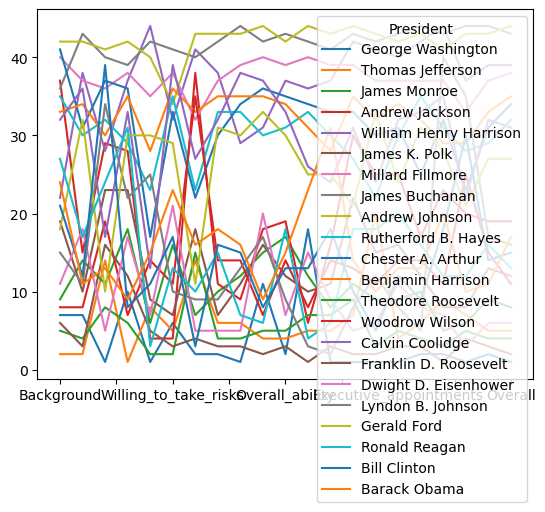

In [61]:
#Transpose T property or transpose() method
( pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']
 .T
 .plot()#.legend(bbox_to_anchor=(1,1))
)

Text(0, 0.5, 'Rank')

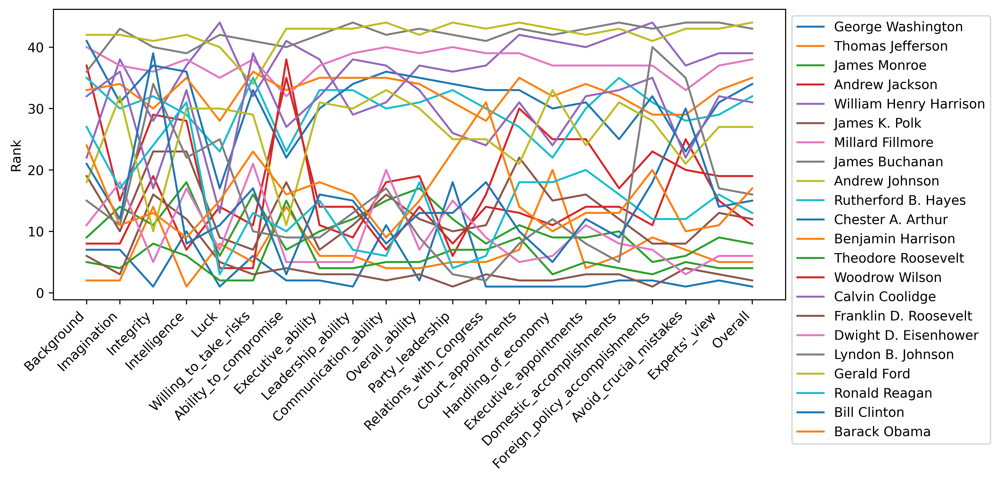

In [64]:
# Cleaning up the plot, because Matplotlib is used by Pandas will use some of its library

import matplotlib.pyplot as plt 


fig, ax = plt.subplots(dpi=600 , figsize=(10,4))   # dpi=600 , figsize=(10,4) are passed pyplot.figure call.

(pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']
.T 
.plot(ax=ax, rot=45).legend(bbox_to_anchor=(1,1))
)
ax.set_xticks(range(21))
ax.set_xticklabels(pres
                   .loc[:,'Background':'Overall'].columns, ha='right')
ax.set_ylabel('Rank')



Text(0, 0.5, 'Rank')

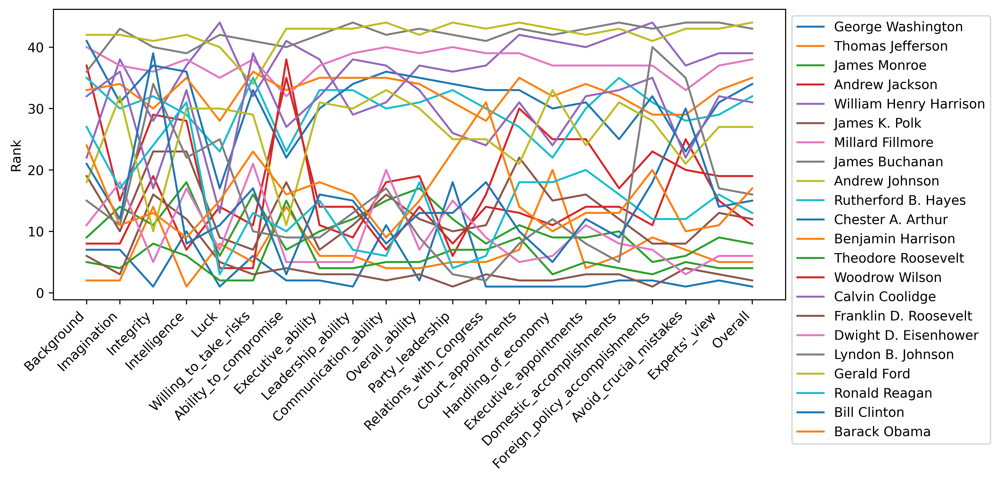

In [27]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))


(pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']
 .T 
 .plot(ax=ax, rot=45)
 .legend(bbox_to_anchor=(1,1))
)

ax.set_xticks(range(21))
ax.set_xticklabels(pres
                   .loc[:,'Background':'Overall'].columns, ha='right')
ax.set_ylabel('Rank')


Text(0, 0.5, 'Rank')

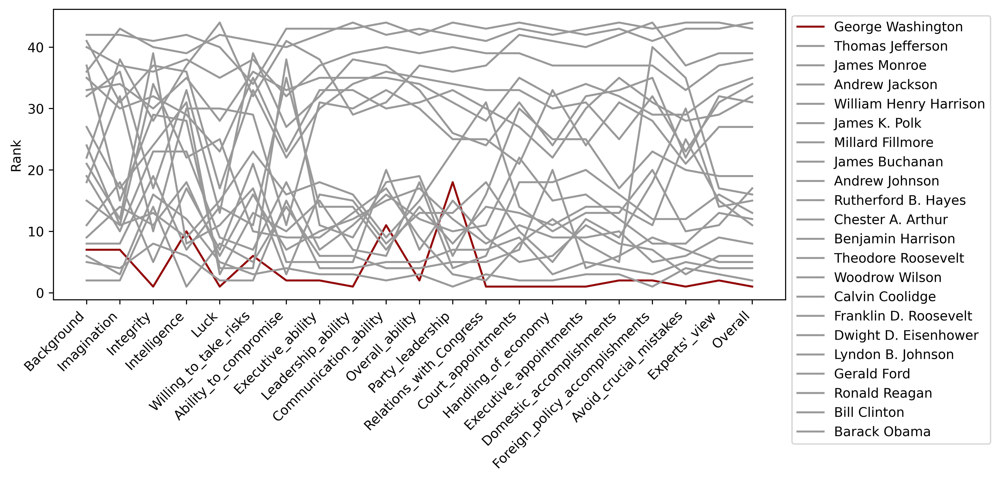

In [24]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))
colors = []

def set_colors(df):
    for col in df.columns:
        if 'George' in col:
            colors.append('#990000')
        else:
            colors.append('#999999')
    return df

(pres
 .set_index('President')
 .loc[::2, 'Background':'Overall']
 .T 
 .pipe(set_colors)
 .plot(ax=ax, rot=45, color=colors)
 .legend(bbox_to_anchor=(1,1))
)

ax.set_xticks(range(21))
ax.set_xticklabels(pres
                   .loc[:,'Background':'Overall'].columns, ha='right')
ax.set_ylabel('Rank')


In [30]:
#25.2 Bar Plots
(pres
 .set_index('President')
 .iloc[:,-5:-1]
)

,Avoid_crucial_mistakes,Experts'_view,Overall,Average_rank
President,,,,
George Washington,1,2,1,1
John Adams,16,10,14,13
Thomas Jefferson,7,5,5,5
James Madison,11,8,7,7
James Monroe,6,9,8,8
...,...,...,...,...
George H. W. Bush,17,21,21,21
Bill Clinton,30,14,15,15
George W. Bush,36,34,33,33


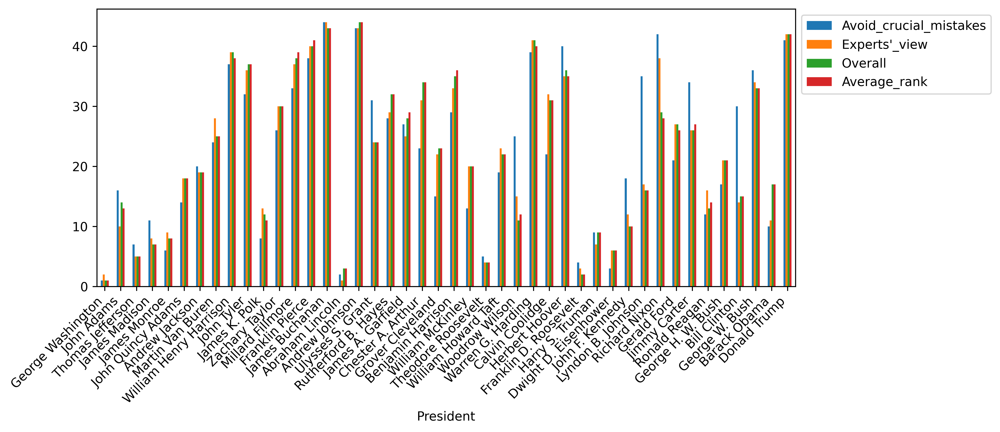

In [33]:
fig, ax = plt.subplots(dpi=600, figsize=(10,4))

(pres
 .set_index('President')
 .iloc[:,-5:-1]
 .plot.bar(rot=45, ax=ax)
)

ax.set_xticklabels(labels=ax.get_xticklabels(), ha='right')
ax.legend(bbox_to_anchor=(1,1))

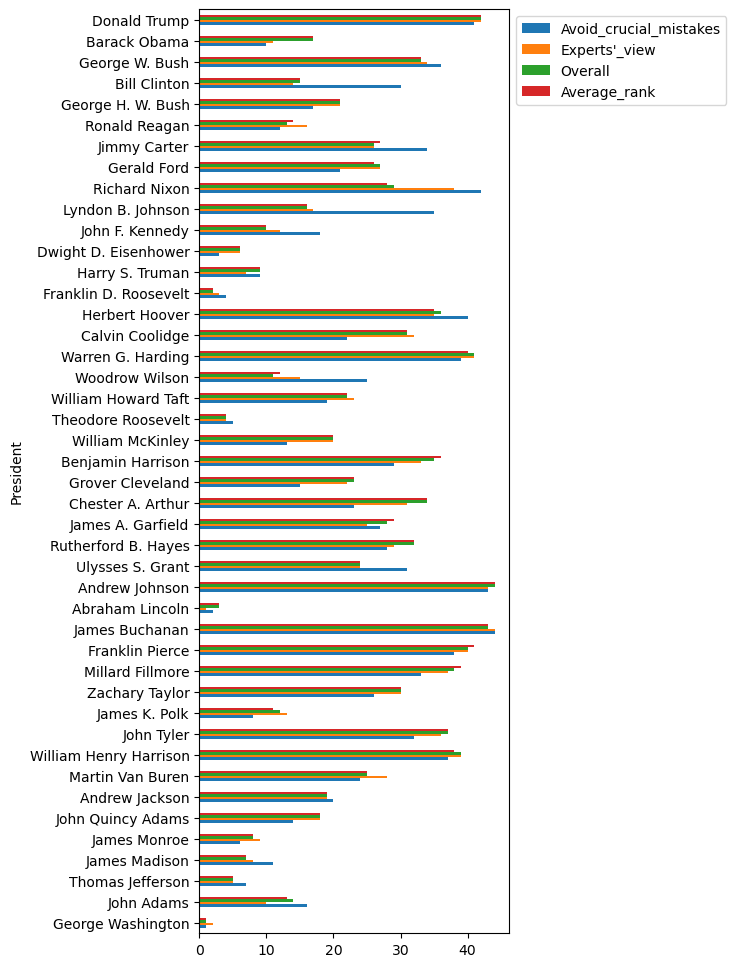

In [39]:
(pres
 .set_index('President')
 .iloc[:,-5:]
 .plot.barh(figsize=(4,12))
 .legend(bbox_to_anchor=(1,1))
)

e:\Users\wgrom\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:1114: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(


<AxesSubplot: xlabel='Integrity', ylabel='Avoid_crucial_mistakes'>

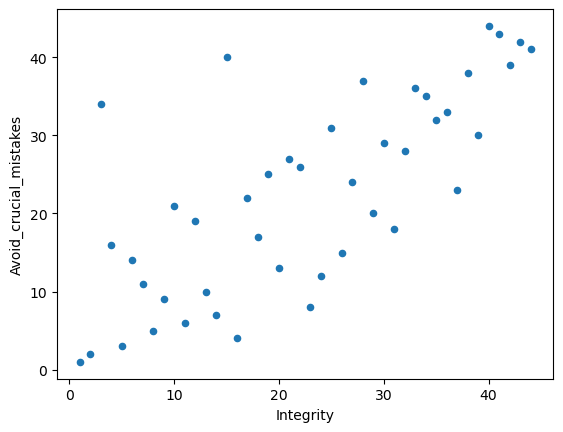

In [40]:
#25.3 Scatter Plots

(pres
 .plot.scatter(x='Integrity', y='Avoid_crucial_mistakes')
)

In [41]:
pres.Integrity.corr(pres.Avoid_crucial_mistakes)

0.7455954897815362

<AxesSubplot: xlabel='Integrity', ylabel='Avoid_crucial_mistakes'>

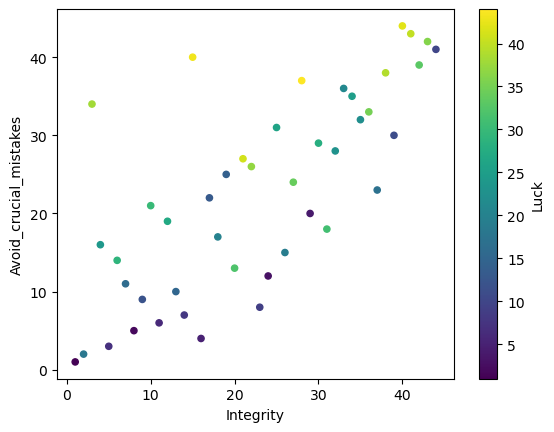

In [65]:
(pres
 .plot.scatter(x='Integrity',y='Avoid_crucial_mistakes', c='Luck', cmap='viridis')
)

<AxesSubplot: xlabel='Integrity', ylabel='Avoid_crucial_mistakes'>

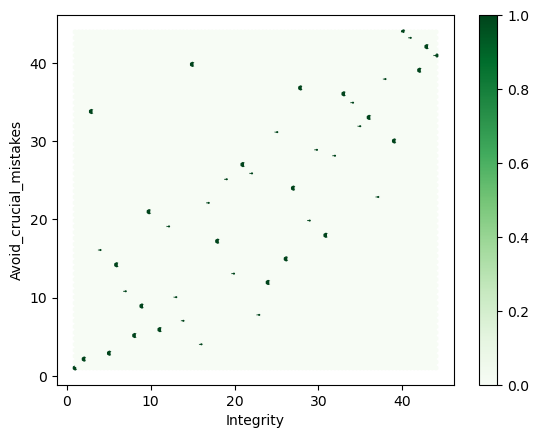

In [66]:
(pres
 .plot.hexbin(x='Integrity',y='Avoid_crucial_mistakes', cmap='Greens'))

<AxesSubplot: xlabel='Integrity', ylabel='Avoid_crucial_mistakes'>

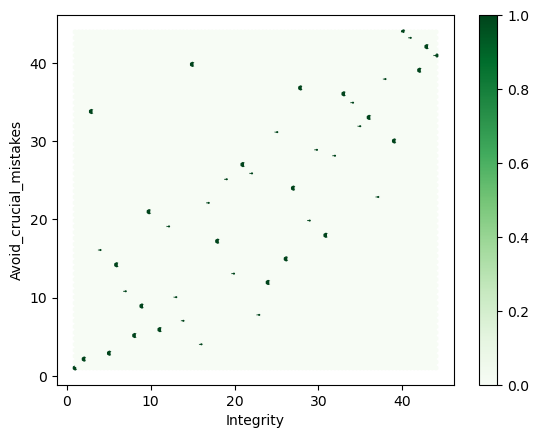

In [54]:
(pres
 .plot.hexbin(x='Integrity', y='Avoid_crucial_mistakes',
    cmap='Greens')
)

25.4 Area Plots and Stacked Bar Plots

[Text(0, 0, 'George Washington'),
 Text(1, 0, 'John Adams'),
 Text(2, 0, 'Thomas Jefferson'),
 Text(3, 0, 'James Madison'),
 Text(4, 0, 'James Monroe'),
 Text(5, 0, 'John Quincy Adams'),
 Text(6, 0, 'Andrew Jackson'),
 Text(7, 0, 'Martin Van Buren'),
 Text(8, 0, 'William Henry Harrison'),
 Text(9, 0, 'John Tyler'),
 Text(10, 0, 'James K. Polk'),
 Text(11, 0, 'Zachary Taylor'),
 Text(12, 0, 'Millard Fillmore'),
 Text(13, 0, 'Franklin Pierce'),
 Text(14, 0, 'James Buchanan'),
 Text(15, 0, 'Abraham Lincoln'),
 Text(16, 0, 'Andrew Johnson'),
 Text(17, 0, 'Ulysses S. Grant'),
 Text(18, 0, 'Rutherford B. Hayes'),
 Text(19, 0, 'James A. Garfield'),
 Text(20, 0, 'Chester A. Arthur'),
 Text(21, 0, 'Grover Cleveland'),
 Text(22, 0, 'Benjamin Harrison'),
 Text(23, 0, 'William McKinley'),
 Text(24, 0, 'Theodore Roosevelt'),
 Text(25, 0, 'William Howard Taft'),
 Text(26, 0, 'Woodrow Wilson'),
 Text(27, 0, 'Warren G. Harding'),
 Text(28, 0, 'Calvin Coolidge'),
 Text(29, 0, 'Herbert Hoover'),
 Text(3

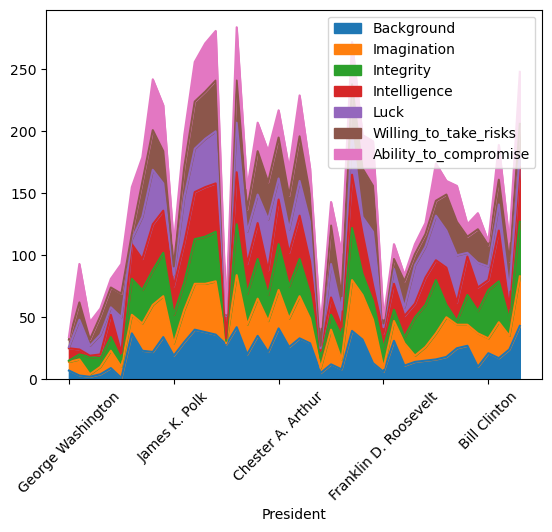

In [55]:
# this is not displaying correctly , why is the text displayed.
(pres
 .plot.area(x='President',y='Background Imagination Integrity Intelligence Luck '\
     'Willing_to_take_risks Ability_to_compromise'.split(),
     rot=45)
)
ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right')

[Text(0, 0, 'George Washington'),
 Text(1, 0, 'John Adams'),
 Text(2, 0, 'Thomas Jefferson'),
 Text(3, 0, 'James Madison'),
 Text(4, 0, 'James Monroe'),
 Text(5, 0, 'John Quincy Adams'),
 Text(6, 0, 'Andrew Jackson'),
 Text(7, 0, 'Martin Van Buren'),
 Text(8, 0, 'William Henry Harrison'),
 Text(9, 0, 'John Tyler'),
 Text(10, 0, 'James K. Polk'),
 Text(11, 0, 'Zachary Taylor'),
 Text(12, 0, 'Millard Fillmore'),
 Text(13, 0, 'Franklin Pierce'),
 Text(14, 0, 'James Buchanan'),
 Text(15, 0, 'Abraham Lincoln'),
 Text(16, 0, 'Andrew Johnson'),
 Text(17, 0, 'Ulysses S. Grant'),
 Text(18, 0, 'Rutherford B. Hayes'),
 Text(19, 0, 'James A. Garfield'),
 Text(20, 0, 'Chester A. Arthur'),
 Text(21, 0, 'Grover Cleveland'),
 Text(22, 0, 'Benjamin Harrison'),
 Text(23, 0, 'William McKinley'),
 Text(24, 0, 'Theodore Roosevelt'),
 Text(25, 0, 'William Howard Taft'),
 Text(26, 0, 'Woodrow Wilson'),
 Text(27, 0, 'Warren G. Harding'),
 Text(28, 0, 'Calvin Coolidge'),
 Text(29, 0, 'Herbert Hoover'),
 Text(3

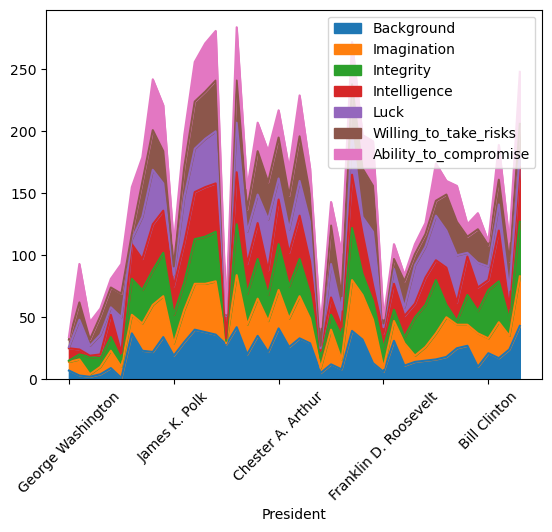

In [53]:
# code from book github page 
(pres
 .plot.area(x='President', 
   y='Background Imagination Integrity Intelligence Luck '\
     'Willing_to_take_risks Ability_to_compromise'.split(),
   rot=45)
)
ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right')

[Text(0, 0, 'George Washington'),
 Text(1, 0, 'John Adams'),
 Text(2, 0, 'Thomas Jefferson'),
 Text(3, 0, 'James Madison'),
 Text(4, 0, 'James Monroe'),
 Text(5, 0, 'John Quincy Adams'),
 Text(6, 0, 'Andrew Jackson'),
 Text(7, 0, 'Martin Van Buren'),
 Text(8, 0, 'William Henry Harrison'),
 Text(9, 0, 'John Tyler'),
 Text(10, 0, 'James K. Polk'),
 Text(11, 0, 'Zachary Taylor'),
 Text(12, 0, 'Millard Fillmore'),
 Text(13, 0, 'Franklin Pierce'),
 Text(14, 0, 'James Buchanan'),
 Text(15, 0, 'Abraham Lincoln'),
 Text(16, 0, 'Andrew Johnson'),
 Text(17, 0, 'Ulysses S. Grant'),
 Text(18, 0, 'Rutherford B. Hayes'),
 Text(19, 0, 'James A. Garfield'),
 Text(20, 0, 'Chester A. Arthur'),
 Text(21, 0, 'Grover Cleveland'),
 Text(22, 0, 'Benjamin Harrison'),
 Text(23, 0, 'William McKinley'),
 Text(24, 0, 'Theodore Roosevelt'),
 Text(25, 0, 'William Howard Taft'),
 Text(26, 0, 'Woodrow Wilson'),
 Text(27, 0, 'Warren G. Harding'),
 Text(28, 0, 'Calvin Coolidge'),
 Text(29, 0, 'Herbert Hoover'),
 Text(3

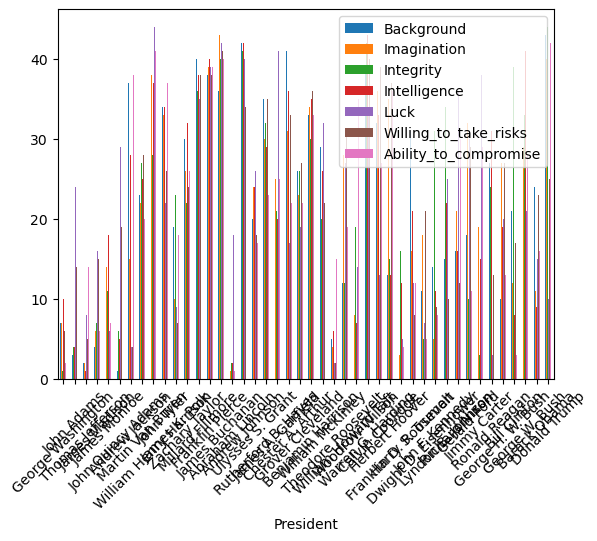

In [52]:
(pres
 .plot.bar(x='President',y='Background Imagination Integrity Intelligence Luck '\
     'Willing_to_take_risks Ability_to_compromise'.split(),
     rot=45)
)
ax.set_xticks(range(len(pres)))
ax.set_xticklabels(labels=pres.President, ha='right')

In [67]:
(pres
 .set_index('President')
 .loc[:,'Background':'Average_rank']
 .iloc[:9]
 .T
 )

President,George Washington,John Adams,Thomas Jefferson,James Madison,James Monroe,John Quincy Adams,Andrew Jackson,Martin Van Buren,William Henry Harrison
Background,7,3,2,4,9,1,37,23,22
Imagination,7,13,2,6,14,9,15,22,38
Integrity,1,4,14,7,11,6,29,27,28
Intelligence,10,4,1,3,18,5,28,25,37
Luck,1,24,8,16,6,29,4,34,44
...,...,...,...,...,...,...,...,...,...
Foreign_policy_accomplishments,2,13,9,19,5,15,23,27,44
Avoid_crucial_mistakes,1,16,7,11,6,14,20,24,37
Experts'_view,2,10,5,8,9,18,19,28,39
Overall,1,14,5,7,8,18,19,25,39


In [68]:
(pres
 .set_index('President')
 .loc[:,'Background':'Average_rank']
 .iloc[:9]
 .T
 .describe()
 )

President,George Washington,John Adams,Thomas Jefferson,James Madison,James Monroe,John Quincy Adams,Andrew Jackson,Martin Van Buren,William Henry Harrison
count,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000,22.000000
mean,3.681818,14.454545,6.545455,9.636364,10.454545,17.181818,19.590909,25.681818,36.909091
std,4.444219,7.544959,4.404838,4.392043,3.634848,7.538071,9.465019,3.721064,5.485124
min,1.000000,3.000000,1.000000,3.000000,5.000000,1.000000,4.000000,16.000000,22.000000
25%,1.000000,10.750000,4.250000,6.250000,8.000000,14.250000,15.250000,24.250000,36.250000
50%,2.000000,13.500000,5.000000,8.500000,9.500000,18.000000,19.000000,25.500000,38.000000
75%,5.000000,18.500000,7.000000,12.500000,12.000000,21.750000,25.000000,27.750000,40.750000
max,18.000000,31.000000,20.000000,19.000000,18.000000,29.000000,38.000000,34.000000,44.000000


<AxesSubplot: ylabel='Density'>

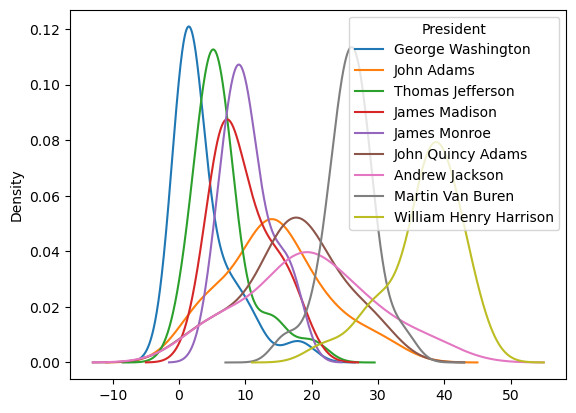

In [70]:
(pres
 .set_index('President')
 .loc[:,'Background':'Average_rank']
 .iloc[:9]
 .T
 .plot.density()
 )

<AxesSubplot: ylabel='Frequency'>

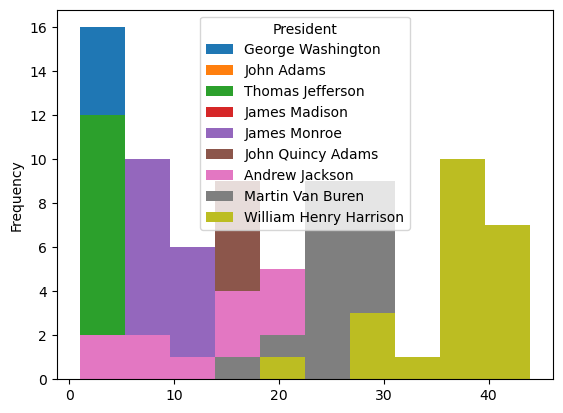

In [71]:
(pres
 .set_index('President')
 .loc[:,'Background':'Average_rank']
 .iloc[:9]
 .T
 .plot.hist()
 )